In [11]:
from medmnist import INFO
from medmnist import BloodMNIST, DermaMNIST
from torchvision import transforms
from torch.utils.data import DataLoader
from collections import Counter
import torch

dataset_name = 'dermamnist'  # or 'dermamnist'
info = INFO[dataset_name]
dataset_classes = {
    'bloodmnist': BloodMNIST,
    'dermamnist': DermaMNIST
}
DataClass = dataset_classes[dataset_name]

transform = transforms.Compose([transforms.ToTensor()])

train_dataset = DataClass(split='train', size=64, root="data", transform=transform, download=True)
dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True)

class_counts = Counter()
for _, labels in dataloader:
    class_counts.update(labels.tolist()[0])

print("Class counts:", class_counts)
print("Class weights:", {k: 1.0 / v for k, v in class_counts.items()})

n_classes = len(info['label'])
class_counts_dict = dict(class_counts)
weights = [0] * len(train_dataset)
for idx, (_, label) in enumerate(train_dataset):
    class_weight = 1.0 / class_counts_dict[label.item()]
    weights[idx] = class_weight

sampler = torch.utils.data.WeightedRandomSampler(weights, len(weights))

val_dataset = DataClass(split='val', size=64, root="data", transform=transform, download=True)
train_loader = DataLoader(train_dataset, batch_size=24, sampler=sampler)
val_loader = DataLoader(val_dataset, batch_size=24)

n_classes = len(info['label'])
print("Number of classes:", n_classes)

Using downloaded and verified file: data\dermamnist_64.npz
Class counts: Counter({5: 4693, 4: 779, 2: 769, 1: 359, 0: 228, 6: 99, 3: 80})
Class weights: {2: 0.0013003901170351106, 5: 0.00021308331557639036, 0: 0.0043859649122807015, 4: 0.0012836970474967907, 1: 0.002785515320334262, 6: 0.010101010101010102, 3: 0.0125}
Using downloaded and verified file: data\dermamnist_64.npz
Number of classes: 7


In [12]:
import matplotlib.pyplot as plt
import torch

def visualize_real_vs_generated(model, val_loader, device, n_classes, num_samples_per_class=3):
    model.eval()

    real_images = {i: [] for i in range(n_classes)}
    with torch.no_grad():
        for x, y in val_loader:
            y = y.squeeze()
            for i in range(len(y)):
                class_idx = y[i].item()
                if len(real_images[class_idx]) < num_samples_per_class:
                    real_images[class_idx].append(x[i])
                if all(len(real_images[c]) >= num_samples_per_class for c in range(n_classes)):
                    break
            if all(len(real_images[c]) >= num_samples_per_class for c in range(n_classes)):
                break

    fake_images = []
    with torch.no_grad():
        for class_idx in range(n_classes):
            y = torch.tensor([class_idx] * num_samples_per_class, dtype=torch.long).to(device)
            samples = model.sample(y, device, num_samples=num_samples_per_class).cpu()
            fake_images.append(samples)

    fig, axs = plt.subplots(n_classes, num_samples_per_class * 2,
                            figsize=(num_samples_per_class * 4, n_classes * 2))
    fig.suptitle("Real vs Generated Samples per Class", fontsize=16)

    for class_idx in range(n_classes):
        for i in range(num_samples_per_class):
            ax = axs[class_idx, i] if n_classes > 1 else axs[i]
            img = real_images[class_idx][i].permute(1, 2, 0).squeeze()
            ax.imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
            ax.axis('off')
            if i == 0:
                ax.set_ylabel(f"Class {class_idx}", fontsize=12)
            if class_idx == 0 and i == 0:
                ax.set_title("Real", fontsize=12)

        for i in range(num_samples_per_class):
            ax = axs[class_idx, i + num_samples_per_class] if n_classes > 1 else axs[i + num_samples_per_class]
            img = fake_images[class_idx][i].permute(1, 2, 0).squeeze()
            ax.imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
            ax.axis('off')
            if class_idx == 0 and i == 0:
                ax.set_title("Generated", fontsize=12)

    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)
        self.norm1 = nn.GroupNorm(8, out_channels)
        self.act = nn.SiLU()
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, padding=1)
        self.norm2 = nn.GroupNorm(8, out_channels)
        self.skip = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x):
        residual = self.skip(x)
        x = self.act(self.norm1(self.conv1(x)))
        x = self.norm2(self.conv2(x))
        return self.act(x + residual)

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.qkv = nn.Conv1d(in_channels, in_channels * 3, 1)
        self.proj = nn.Conv1d(in_channels, in_channels, 1)

    def forward(self, x):
        B, C, H, W = x.shape
        x_flat = x.view(B, C, -1)
        qkv = self.qkv(x_flat)
        q, k, v = torch.chunk(qkv, 3, dim=1)

        attn_scores = torch.bmm(q.transpose(1, 2), k) / math.sqrt(C)
        attn = F.softmax(attn_scores, dim=-1)
        out = torch.bmm(v, attn.transpose(1, 2)).view(B, C, H, W)
        return self.proj(out.view(B, C, -1)).view(B, C, H, W) + x

class ConditionalDiffusionModel(nn.Module):
    def __init__(self, num_labels=8, embed_dim=8, img_channels=3):
        super().__init__()
        self.embed_dim = embed_dim
        self.img_channels = img_channels
        self.time_dim = 128
        self.num_timesteps = 1000

        self.label_embedding = nn.Embedding(num_labels, embed_dim)
        self.time_emb_proj = nn.Sequential(
            nn.Linear(self.time_dim, 512),
            nn.SiLU(),
            nn.Linear(512, 512)
        )

        # Encoder
        self.enc1 = ResidualBlock(img_channels + embed_dim, 64)
        self.enc2 = ResidualBlock(64, 128)
        self.enc3 = ResidualBlock(128, 256)
        self.enc4 = ResidualBlock(256, 512)
        self.pool = nn.MaxPool2d(2, 2)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            ResidualBlock(512, 512),
            SelfAttention(512)
        )

        # Decoder
        self.up4 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec4 = ResidualBlock(512 + 256, 256)
        self.up3 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec3 = ResidualBlock(256 + 128, 128)
        self.up2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec2 = ResidualBlock(128 + 64, 64)
        self.up1 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.dec1 = ResidualBlock(64 + 32, 32)
        self.out = nn.Conv2d(32, img_channels, 3, padding=1)

        # Noise scheduler
        self.register_buffer('betas', torch.linspace(0.0001, 0.02, self.num_timesteps))
        self.register_buffer('alphas', 1.0 - self.betas)
        self.register_buffer('alpha_cumprod', torch.cumprod(self.alphas, dim=0))

    def get_sinusoidal_embedding(self, t, dim=128):
        device = t.device
        half_dim = dim // 2
        emb = torch.exp(torch.arange(half_dim, device=device) * -(math.log(10000.0) / half_dim))
        emb = t[:, None] * emb[None, :]
        return torch.cat([torch.sin(emb), torch.cos(emb)], dim=-1)

    def forward_diffusion(self, x0, t, device):
        noise = torch.randn_like(x0)
        sqrt_alpha_cumprod = torch.sqrt(self.alpha_cumprod[t])[:, None, None, None]
        sqrt_one_minus_alpha_cumprod = torch.sqrt(1.0 - self.alpha_cumprod[t])[:, None, None, None]
        xt = sqrt_alpha_cumprod * x0 + sqrt_one_minus_alpha_cumprod * noise
        return xt, noise

    def forward(self, x, t, y):
        y_embed = self.label_embedding(y)
        y_img = y_embed[:, :, None, None].expand(-1, -1, x.shape[2], x.shape[3])
        x_cat = torch.cat([x, y_img], dim=1)

        t_emb = self.get_sinusoidal_embedding(t, self.time_dim)
        t_emb = self.time_emb_proj(t_emb).unsqueeze(-1).unsqueeze(-1)

        e1 = self.enc1(x_cat)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))

        b = self.bottleneck(self.pool(e4)) + t_emb

        d4 = self.up4(b)
        d4 = self.dec4(torch.cat([d4, e4], dim=1))
        d3 = self.up3(d4)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))
        d2 = self.up2(d3)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        d1 = self.up1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))
        return self.out(d1)

    def sample(self, y, device, num_samples=1):
        x_t = torch.randn(num_samples, self.img_channels, 64, 64).to(device)
        self.eval()
        with torch.no_grad():
            for t in reversed(range(self.num_timesteps)):
                t_tensor = torch.full((num_samples,), t, device=device, dtype=torch.long)
                pred_noise = self.forward(x_t, t_tensor, y)

                alpha = self.alphas[t]
                alpha_cumprod = self.alpha_cumprod[t]
                beta = self.betas[t]
                noise = torch.randn_like(x_t) if t > 0 else torch.zeros_like(x_t)

                x_t = (1.0 / torch.sqrt(alpha)) * (
                    x_t - ((1 - alpha) / torch.sqrt(1 - alpha_cumprod)) * pred_noise
                ) + torch.sqrt(beta) * noise
        self.train()
        return torch.clamp(x_t, 0, 1)


Epoch 1/150: 100%|██████████| 292/292 [00:34<00:00,  8.42it/s, Train Loss=0.082104, LR=0.000500]


Epoch 1: Train Loss=0.082104, Val Loss=0.025936, LR=0.000500
Saved best model at epoch 1 with Val Loss=0.025936


Epoch 2/150: 100%|██████████| 292/292 [00:35<00:00,  8.31it/s, Train Loss=0.018956, LR=0.000500]


Epoch 2: Train Loss=0.018956, Val Loss=0.019612, LR=0.000500
Saved best model at epoch 2 with Val Loss=0.019612


Epoch 3/150: 100%|██████████| 292/292 [00:35<00:00,  8.25it/s, Train Loss=0.013396, LR=0.000500]


Epoch 3: Train Loss=0.013396, Val Loss=0.013846, LR=0.000500
Saved best model at epoch 3 with Val Loss=0.013846


Epoch 4/150: 100%|██████████| 292/292 [00:35<00:00,  8.26it/s, Train Loss=0.012170, LR=0.000500]


Epoch 4: Train Loss=0.012170, Val Loss=0.012042, LR=0.000500
Saved best model at epoch 4 with Val Loss=0.012042


Epoch 5/150: 100%|██████████| 292/292 [00:35<00:00,  8.16it/s, Train Loss=0.011831, LR=0.000500]


Epoch 5: Train Loss=0.011831, Val Loss=0.010320, LR=0.000500
Saved best model at epoch 5 with Val Loss=0.010320


Epoch 6/150: 100%|██████████| 292/292 [00:36<00:00,  8.00it/s, Train Loss=0.010824, LR=0.000500]


Epoch 6: Train Loss=0.010824, Val Loss=0.013120, LR=0.000500


Epoch 7/150: 100%|██████████| 292/292 [00:36<00:00,  8.02it/s, Train Loss=0.010163, LR=0.000500]


Epoch 7: Train Loss=0.010163, Val Loss=0.011901, LR=0.000500


Epoch 8/150: 100%|██████████| 292/292 [00:37<00:00,  7.84it/s, Train Loss=0.008529, LR=0.000500]


Epoch 8: Train Loss=0.008529, Val Loss=0.007731, LR=0.000500
Saved best model at epoch 8 with Val Loss=0.007731


Epoch 9/150: 100%|██████████| 292/292 [00:38<00:00,  7.68it/s, Train Loss=0.008480, LR=0.000500]


Epoch 9: Train Loss=0.008480, Val Loss=0.008475, LR=0.000500


Epoch 10/150: 100%|██████████| 292/292 [00:41<00:00,  7.07it/s, Train Loss=0.009409, LR=0.000500]


Epoch 10: Train Loss=0.009409, Val Loss=0.008180, LR=0.000500
Generating visualization at epoch 10


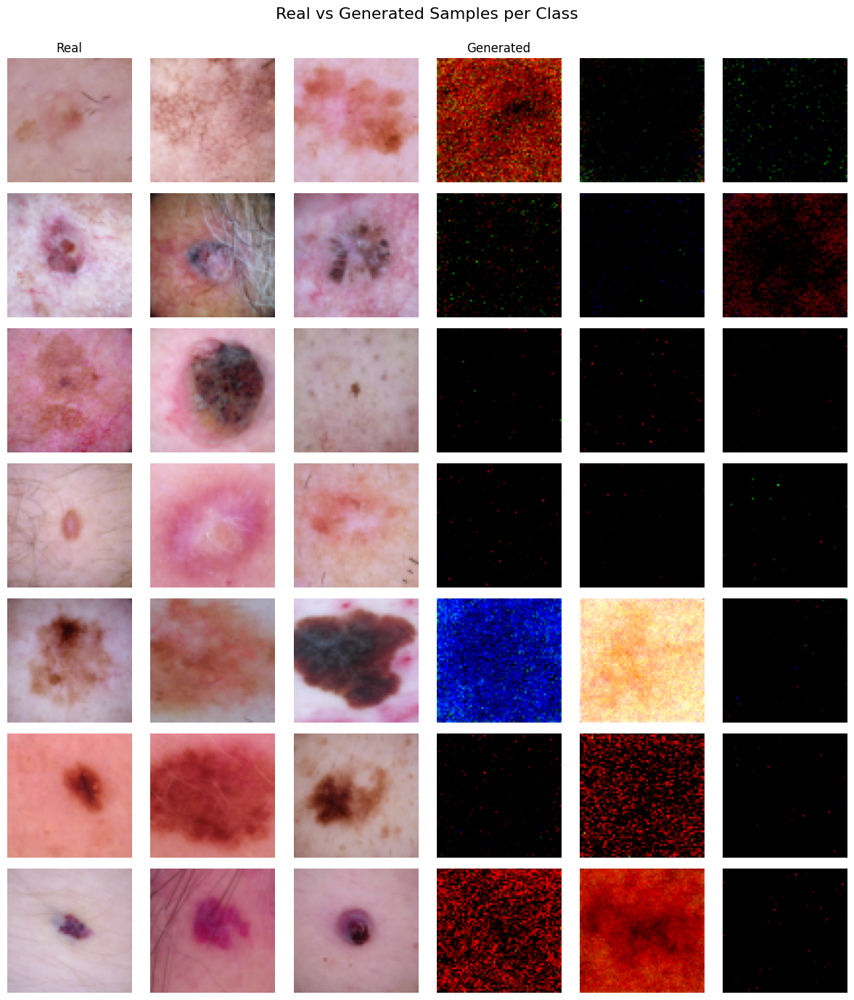

Epoch 11/150: 100%|██████████| 292/292 [00:36<00:00,  7.92it/s, Train Loss=0.009237, LR=0.000500]


Epoch 11: Train Loss=0.009237, Val Loss=0.009297, LR=0.000500


Epoch 12/150: 100%|██████████| 292/292 [00:37<00:00,  7.82it/s, Train Loss=0.008449, LR=0.000500]


Epoch 12: Train Loss=0.008449, Val Loss=0.007771, LR=0.000500


Epoch 13/150: 100%|██████████| 292/292 [00:37<00:00,  7.84it/s, Train Loss=0.008921, LR=0.000500]


Epoch 13: Train Loss=0.008921, Val Loss=0.007430, LR=0.000500
Saved best model at epoch 13 with Val Loss=0.007430


Epoch 14/150: 100%|██████████| 292/292 [00:37<00:00,  7.81it/s, Train Loss=0.008450, LR=0.000500]


Epoch 14: Train Loss=0.008450, Val Loss=0.008133, LR=0.000500


Epoch 15/150: 100%|██████████| 292/292 [00:37<00:00,  7.88it/s, Train Loss=0.007525, LR=0.000500]


Epoch 15: Train Loss=0.007525, Val Loss=0.009376, LR=0.000500


Epoch 16/150: 100%|██████████| 292/292 [00:37<00:00,  7.82it/s, Train Loss=0.007185, LR=0.000500]


Epoch 16: Train Loss=0.007185, Val Loss=0.006880, LR=0.000500
Saved best model at epoch 16 with Val Loss=0.006880


Epoch 17/150: 100%|██████████| 292/292 [00:36<00:00,  7.98it/s, Train Loss=0.007616, LR=0.000500]


Epoch 17: Train Loss=0.007616, Val Loss=0.007177, LR=0.000500


Epoch 18/150: 100%|██████████| 292/292 [00:37<00:00,  7.79it/s, Train Loss=0.007958, LR=0.000500]


Epoch 18: Train Loss=0.007958, Val Loss=0.006126, LR=0.000500
Saved best model at epoch 18 with Val Loss=0.006126


Epoch 19/150: 100%|██████████| 292/292 [00:36<00:00,  7.89it/s, Train Loss=0.007752, LR=0.000500]


Epoch 19: Train Loss=0.007752, Val Loss=0.005914, LR=0.000500
Saved best model at epoch 19 with Val Loss=0.005914


Epoch 20/150: 100%|██████████| 292/292 [00:37<00:00,  7.83it/s, Train Loss=0.007099, LR=0.000500]


Epoch 20: Train Loss=0.007099, Val Loss=0.005846, LR=0.000500
Saved best model at epoch 20 with Val Loss=0.005846
Generating visualization at epoch 20


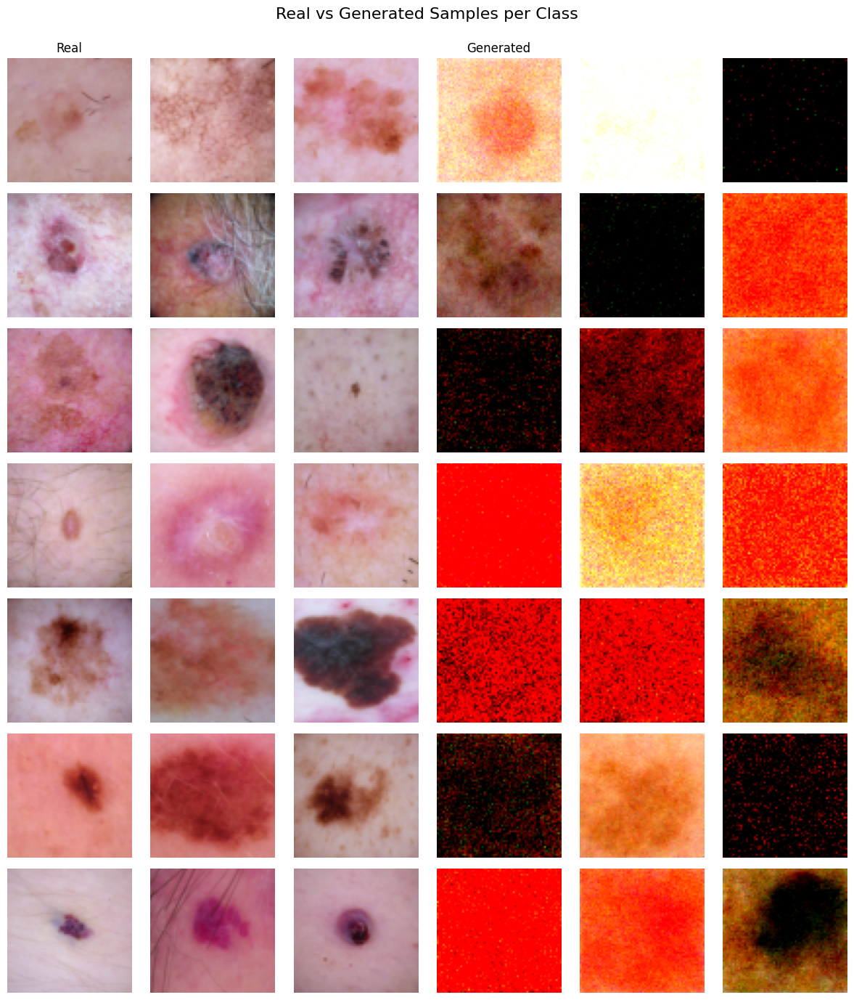

Epoch 21/150: 100%|██████████| 292/292 [00:36<00:00,  7.96it/s, Train Loss=0.007137, LR=0.000500]


Epoch 21: Train Loss=0.007137, Val Loss=0.005124, LR=0.000500
Saved best model at epoch 21 with Val Loss=0.005124


Epoch 22/150: 100%|██████████| 292/292 [00:36<00:00,  7.93it/s, Train Loss=0.006864, LR=0.000500]


Epoch 22: Train Loss=0.006864, Val Loss=0.006958, LR=0.000500


Epoch 23/150: 100%|██████████| 292/292 [00:37<00:00,  7.75it/s, Train Loss=0.007136, LR=0.000500]


Epoch 23: Train Loss=0.007136, Val Loss=0.005436, LR=0.000500


Epoch 24/150: 100%|██████████| 292/292 [00:37<00:00,  7.84it/s, Train Loss=0.007119, LR=0.000500]


Epoch 24: Train Loss=0.007119, Val Loss=0.006613, LR=0.000500


Epoch 25/150: 100%|██████████| 292/292 [00:37<00:00,  7.74it/s, Train Loss=0.007246, LR=0.000500]


Epoch 25: Train Loss=0.007246, Val Loss=0.005368, LR=0.000500


Epoch 26/150: 100%|██████████| 292/292 [00:37<00:00,  7.83it/s, Train Loss=0.007793, LR=0.000500]


Epoch 26: Train Loss=0.007793, Val Loss=0.007824, LR=0.000500


Epoch 27/150: 100%|██████████| 292/292 [00:38<00:00,  7.66it/s, Train Loss=0.007670, LR=0.000500]


Epoch 27: Train Loss=0.007670, Val Loss=0.005985, LR=0.000500


Epoch 28/150: 100%|██████████| 292/292 [00:42<00:00,  6.86it/s, Train Loss=0.007312, LR=0.000500]


Epoch 28: Train Loss=0.007312, Val Loss=0.005766, LR=0.000500


Epoch 29/150: 100%|██████████| 292/292 [00:42<00:00,  6.92it/s, Train Loss=0.006467, LR=0.000500]


Epoch 29: Train Loss=0.006467, Val Loss=0.006837, LR=0.000500


Epoch 30/150: 100%|██████████| 292/292 [00:41<00:00,  7.09it/s, Train Loss=0.006979, LR=0.000500]


Epoch 30: Train Loss=0.006979, Val Loss=0.006498, LR=0.000500
Generating visualization at epoch 30


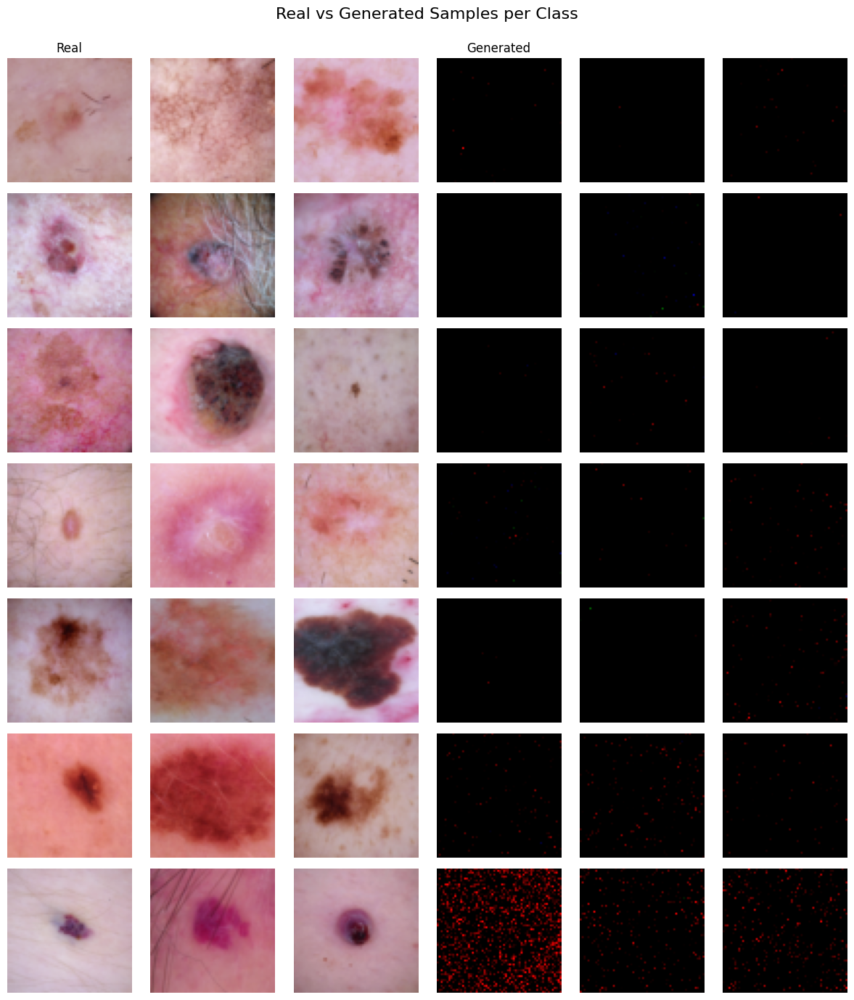

Epoch 31/150: 100%|██████████| 292/292 [00:40<00:00,  7.18it/s, Train Loss=0.006740, LR=0.000500]


Epoch 31: Train Loss=0.006740, Val Loss=0.006930, LR=0.000500


Epoch 32/150: 100%|██████████| 292/292 [00:40<00:00,  7.15it/s, Train Loss=0.006538, LR=0.000500]


Epoch 32: Train Loss=0.006538, Val Loss=0.005196, LR=0.000250


Epoch 33/150: 100%|██████████| 292/292 [00:40<00:00,  7.18it/s, Train Loss=0.006167, LR=0.000250]


Epoch 33: Train Loss=0.006167, Val Loss=0.004736, LR=0.000250
Saved best model at epoch 33 with Val Loss=0.004736


Epoch 34/150: 100%|██████████| 292/292 [00:41<00:00,  7.11it/s, Train Loss=0.005847, LR=0.000250]


Epoch 34: Train Loss=0.005847, Val Loss=0.005636, LR=0.000250


Epoch 35/150: 100%|██████████| 292/292 [00:40<00:00,  7.23it/s, Train Loss=0.005822, LR=0.000250]


Epoch 35: Train Loss=0.005822, Val Loss=0.006533, LR=0.000250


Epoch 36/150: 100%|██████████| 292/292 [00:40<00:00,  7.22it/s, Train Loss=0.006179, LR=0.000250]


Epoch 36: Train Loss=0.006179, Val Loss=0.004854, LR=0.000250


Epoch 37/150: 100%|██████████| 292/292 [00:40<00:00,  7.17it/s, Train Loss=0.006329, LR=0.000250]


Epoch 37: Train Loss=0.006329, Val Loss=0.004663, LR=0.000250
Saved best model at epoch 37 with Val Loss=0.004663


Epoch 38/150: 100%|██████████| 292/292 [00:40<00:00,  7.23it/s, Train Loss=0.006546, LR=0.000250]


Epoch 38: Train Loss=0.006546, Val Loss=0.005895, LR=0.000250


Epoch 39/150: 100%|██████████| 292/292 [00:41<00:00,  7.11it/s, Train Loss=0.006505, LR=0.000250]


Epoch 39: Train Loss=0.006505, Val Loss=0.006021, LR=0.000250


Epoch 40/150: 100%|██████████| 292/292 [00:41<00:00,  7.09it/s, Train Loss=0.005808, LR=0.000250]


Epoch 40: Train Loss=0.005808, Val Loss=0.005313, LR=0.000250
Generating visualization at epoch 40


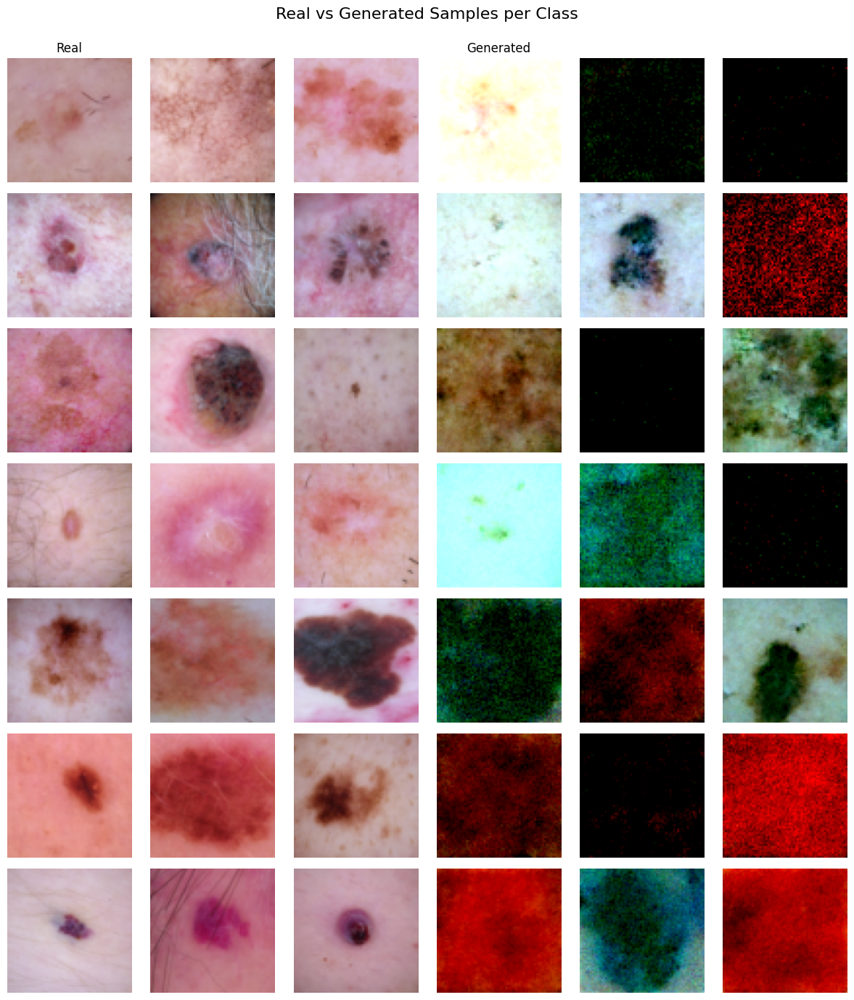

Epoch 41/150: 100%|██████████| 292/292 [00:39<00:00,  7.31it/s, Train Loss=0.006239, LR=0.000250]


Epoch 41: Train Loss=0.006239, Val Loss=0.005523, LR=0.000250


Epoch 42/150: 100%|██████████| 292/292 [00:40<00:00,  7.15it/s, Train Loss=0.005881, LR=0.000250]


Epoch 42: Train Loss=0.005881, Val Loss=0.006018, LR=0.000250


Epoch 43/150: 100%|██████████| 292/292 [00:42<00:00,  6.91it/s, Train Loss=0.006338, LR=0.000250]


Epoch 43: Train Loss=0.006338, Val Loss=0.005145, LR=0.000250


Epoch 44/150: 100%|██████████| 292/292 [00:44<00:00,  6.55it/s, Train Loss=0.006274, LR=0.000250]


Epoch 44: Train Loss=0.006274, Val Loss=0.005810, LR=0.000250


Epoch 45/150: 100%|██████████| 292/292 [00:42<00:00,  6.88it/s, Train Loss=0.006146, LR=0.000250]


Epoch 45: Train Loss=0.006146, Val Loss=0.007154, LR=0.000250


Epoch 46/150: 100%|██████████| 292/292 [00:42<00:00,  6.95it/s, Train Loss=0.006007, LR=0.000250]


Epoch 46: Train Loss=0.006007, Val Loss=0.005804, LR=0.000250


Epoch 47/150: 100%|██████████| 292/292 [00:40<00:00,  7.12it/s, Train Loss=0.006250, LR=0.000250]


Epoch 47: Train Loss=0.006250, Val Loss=0.006485, LR=0.000250


Epoch 48/150: 100%|██████████| 292/292 [00:41<00:00,  7.10it/s, Train Loss=0.006349, LR=0.000250]


Epoch 48: Train Loss=0.006349, Val Loss=0.003860, LR=0.000250
Saved best model at epoch 48 with Val Loss=0.003860


Epoch 49/150: 100%|██████████| 292/292 [00:41<00:00,  7.07it/s, Train Loss=0.006340, LR=0.000250]


Epoch 49: Train Loss=0.006340, Val Loss=0.005048, LR=0.000250


Epoch 50/150: 100%|██████████| 292/292 [00:41<00:00,  7.04it/s, Train Loss=0.006222, LR=0.000250]


Epoch 50: Train Loss=0.006222, Val Loss=0.006223, LR=0.000250
Generating visualization at epoch 50


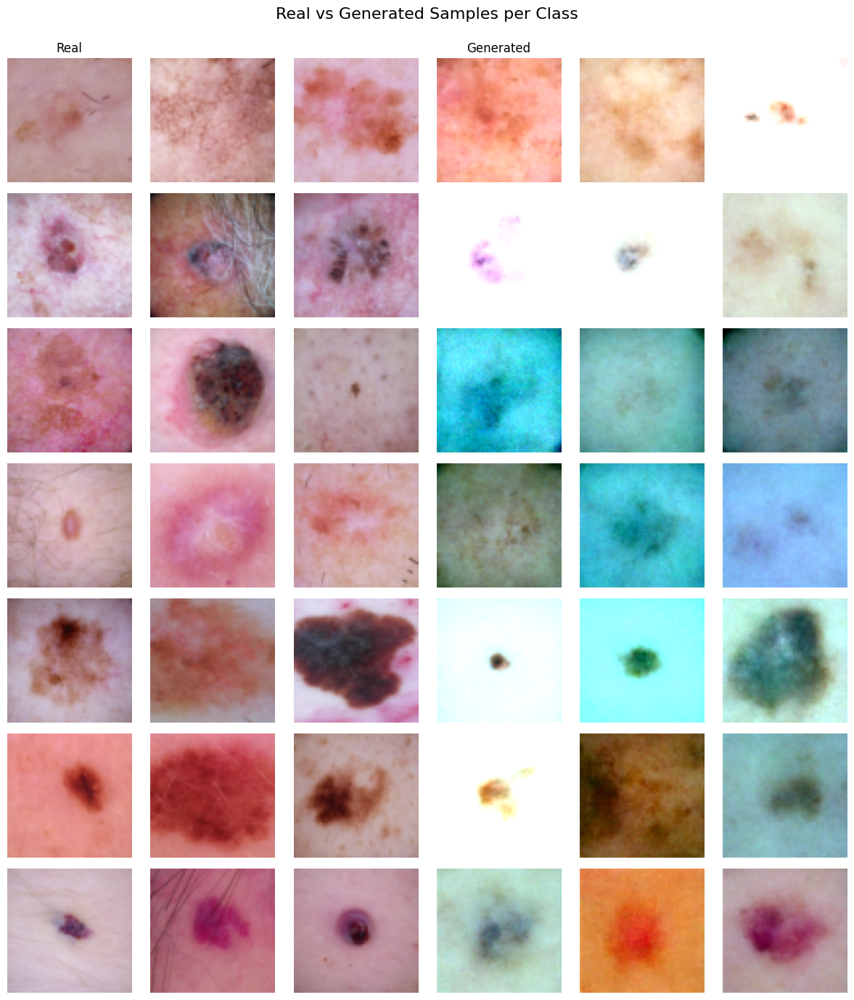

Epoch 51/150: 100%|██████████| 292/292 [00:40<00:00,  7.25it/s, Train Loss=0.006156, LR=0.000250]


Epoch 51: Train Loss=0.006156, Val Loss=0.005144, LR=0.000250


Epoch 52/150: 100%|██████████| 292/292 [00:41<00:00,  7.10it/s, Train Loss=0.006193, LR=0.000250]


Epoch 52: Train Loss=0.006193, Val Loss=0.006218, LR=0.000250


Epoch 53/150: 100%|██████████| 292/292 [00:41<00:00,  7.09it/s, Train Loss=0.005594, LR=0.000250]


Epoch 53: Train Loss=0.005594, Val Loss=0.006707, LR=0.000250


Epoch 54/150: 100%|██████████| 292/292 [00:41<00:00,  6.98it/s, Train Loss=0.005956, LR=0.000250]


Epoch 54: Train Loss=0.005956, Val Loss=0.006915, LR=0.000250


Epoch 55/150: 100%|██████████| 292/292 [00:42<00:00,  6.91it/s, Train Loss=0.006174, LR=0.000250]


Epoch 55: Train Loss=0.006174, Val Loss=0.005227, LR=0.000250


Epoch 56/150: 100%|██████████| 292/292 [00:41<00:00,  7.01it/s, Train Loss=0.006445, LR=0.000250]


Epoch 56: Train Loss=0.006445, Val Loss=0.005796, LR=0.000250


Epoch 57/150: 100%|██████████| 292/292 [00:41<00:00,  7.11it/s, Train Loss=0.006092, LR=0.000250]


Epoch 57: Train Loss=0.006092, Val Loss=0.005781, LR=0.000250


Epoch 58/150: 100%|██████████| 292/292 [00:41<00:00,  6.98it/s, Train Loss=0.006353, LR=0.000250]


Epoch 58: Train Loss=0.006353, Val Loss=0.005178, LR=0.000250


Epoch 59/150: 100%|██████████| 292/292 [00:41<00:00,  7.03it/s, Train Loss=0.006081, LR=0.000250]


Epoch 59: Train Loss=0.006081, Val Loss=0.006111, LR=0.000125


Epoch 60/150: 100%|██████████| 292/292 [00:41<00:00,  7.03it/s, Train Loss=0.005948, LR=0.000125]


Epoch 60: Train Loss=0.005948, Val Loss=0.005347, LR=0.000125
Generating visualization at epoch 60


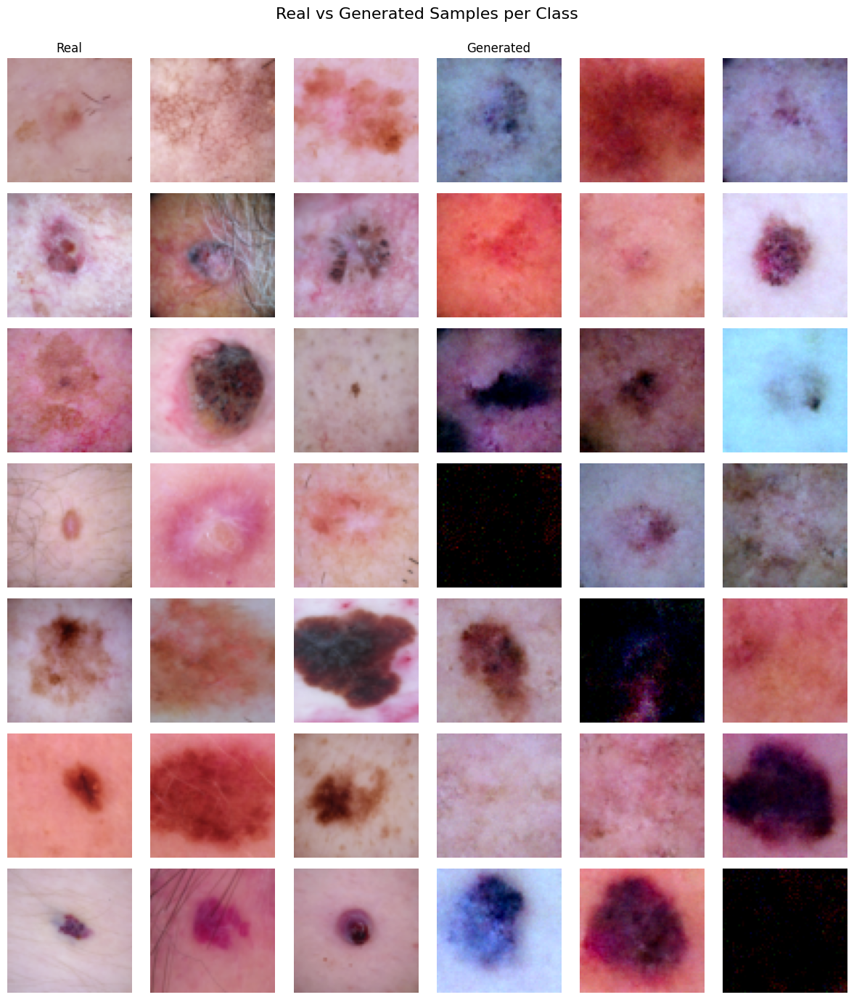

Epoch 61/150: 100%|██████████| 292/292 [00:36<00:00,  8.09it/s, Train Loss=0.005502, LR=0.000125]


Epoch 61: Train Loss=0.005502, Val Loss=0.004646, LR=0.000125


Epoch 62/150: 100%|██████████| 292/292 [00:33<00:00,  8.62it/s, Train Loss=0.005551, LR=0.000125]


Epoch 62: Train Loss=0.005551, Val Loss=0.005267, LR=0.000125


Epoch 63/150: 100%|██████████| 292/292 [00:34<00:00,  8.40it/s, Train Loss=0.006064, LR=0.000125]


Epoch 63: Train Loss=0.006064, Val Loss=0.004598, LR=0.000125


Epoch 64/150: 100%|██████████| 292/292 [00:34<00:00,  8.49it/s, Train Loss=0.006099, LR=0.000125]


Epoch 64: Train Loss=0.006099, Val Loss=0.004768, LR=0.000125


Epoch 65/150: 100%|██████████| 292/292 [00:37<00:00,  7.72it/s, Train Loss=0.005903, LR=0.000125]


Epoch 65: Train Loss=0.005903, Val Loss=0.005242, LR=0.000125


Epoch 66/150: 100%|██████████| 292/292 [00:34<00:00,  8.54it/s, Train Loss=0.005628, LR=0.000125]


Epoch 66: Train Loss=0.005628, Val Loss=0.005005, LR=0.000125


Epoch 67/150: 100%|██████████| 292/292 [00:35<00:00,  8.19it/s, Train Loss=0.005702, LR=0.000125]


Epoch 67: Train Loss=0.005702, Val Loss=0.004840, LR=0.000125


Epoch 68/150: 100%|██████████| 292/292 [00:40<00:00,  7.17it/s, Train Loss=0.005592, LR=0.000125]


Epoch 68: Train Loss=0.005592, Val Loss=0.005515, LR=0.000125


Epoch 69/150: 100%|██████████| 292/292 [00:41<00:00,  7.11it/s, Train Loss=0.005511, LR=0.000125]


Epoch 69: Train Loss=0.005511, Val Loss=0.004583, LR=0.000125


Epoch 70/150: 100%|██████████| 292/292 [00:39<00:00,  7.45it/s, Train Loss=0.005438, LR=0.000125]


Epoch 70: Train Loss=0.005438, Val Loss=0.005560, LR=0.000063
Generating visualization at epoch 70


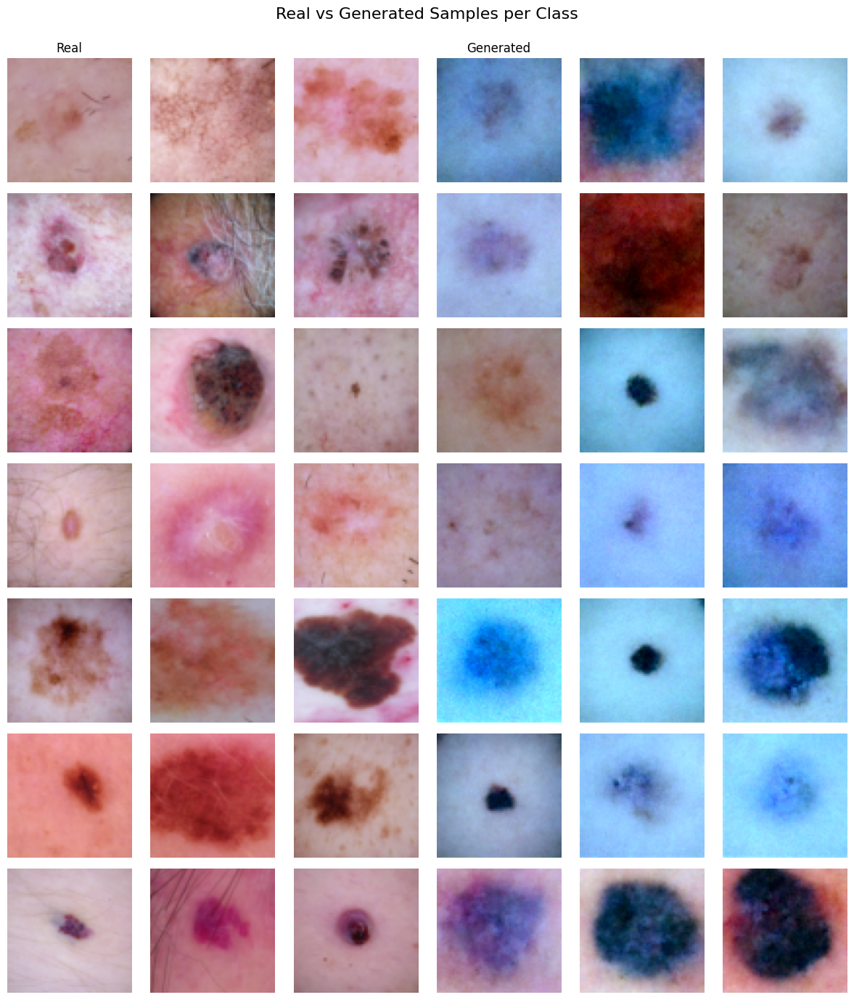

Epoch 71/150: 100%|██████████| 292/292 [00:40<00:00,  7.19it/s, Train Loss=0.005447, LR=0.000063]


Epoch 71: Train Loss=0.005447, Val Loss=0.004452, LR=0.000063


Epoch 72/150: 100%|██████████| 292/292 [00:40<00:00,  7.13it/s, Train Loss=0.006203, LR=0.000063]


Epoch 72: Train Loss=0.006203, Val Loss=0.005597, LR=0.000063


Epoch 73/150: 100%|██████████| 292/292 [00:41<00:00,  7.05it/s, Train Loss=0.005477, LR=0.000063]


Epoch 73: Train Loss=0.005477, Val Loss=0.004040, LR=0.000063


Epoch 74/150: 100%|██████████| 292/292 [00:42<00:00,  6.89it/s, Train Loss=0.005622, LR=0.000063]


Epoch 74: Train Loss=0.005622, Val Loss=0.005508, LR=0.000063


Epoch 75/150: 100%|██████████| 292/292 [00:42<00:00,  6.82it/s, Train Loss=0.005467, LR=0.000063]


Epoch 75: Train Loss=0.005467, Val Loss=0.005806, LR=0.000063


Epoch 76/150: 100%|██████████| 292/292 [00:40<00:00,  7.14it/s, Train Loss=0.005927, LR=0.000063]


Epoch 76: Train Loss=0.005927, Val Loss=0.004817, LR=0.000063


Epoch 77/150: 100%|██████████| 292/292 [00:40<00:00,  7.14it/s, Train Loss=0.005400, LR=0.000063]


Epoch 77: Train Loss=0.005400, Val Loss=0.006425, LR=0.000063


Epoch 78/150: 100%|██████████| 292/292 [00:40<00:00,  7.15it/s, Train Loss=0.005092, LR=0.000063]


Epoch 78: Train Loss=0.005092, Val Loss=0.005837, LR=0.000063


Epoch 79/150: 100%|██████████| 292/292 [00:40<00:00,  7.16it/s, Train Loss=0.005947, LR=0.000063]


Epoch 79: Train Loss=0.005947, Val Loss=0.004989, LR=0.000063


Epoch 80/150: 100%|██████████| 292/292 [00:40<00:00,  7.19it/s, Train Loss=0.005532, LR=0.000063]


Epoch 80: Train Loss=0.005532, Val Loss=0.004312, LR=0.000063
Generating visualization at epoch 80


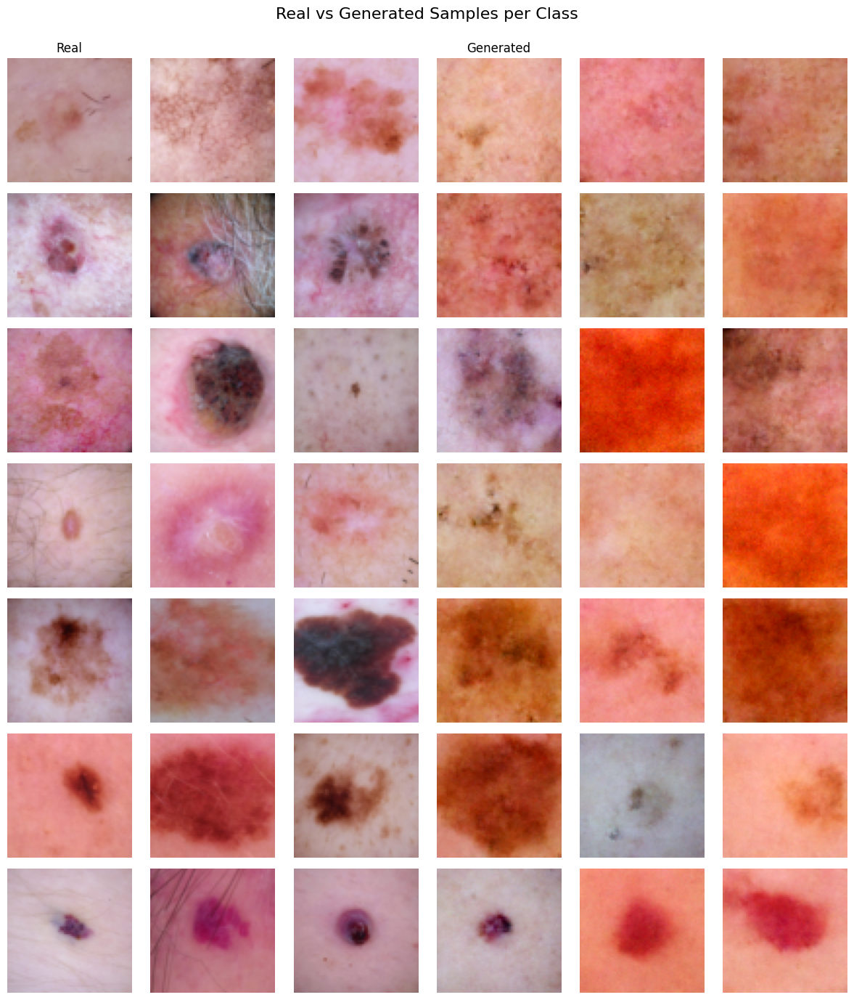

Epoch 81/150: 100%|██████████| 292/292 [00:43<00:00,  6.67it/s, Train Loss=0.005321, LR=0.000063]


Epoch 81: Train Loss=0.005321, Val Loss=0.006463, LR=0.000031


Epoch 82/150: 100%|██████████| 292/292 [00:42<00:00,  6.81it/s, Train Loss=0.006009, LR=0.000031]


Epoch 82: Train Loss=0.006009, Val Loss=0.005099, LR=0.000031


Epoch 83/150: 100%|██████████| 292/292 [00:41<00:00,  7.04it/s, Train Loss=0.005594, LR=0.000031]


Epoch 83: Train Loss=0.005594, Val Loss=0.005150, LR=0.000031


Epoch 84/150: 100%|██████████| 292/292 [00:41<00:00,  7.01it/s, Train Loss=0.005585, LR=0.000031]


Epoch 84: Train Loss=0.005585, Val Loss=0.005127, LR=0.000031


Epoch 85/150: 100%|██████████| 292/292 [00:42<00:00,  6.89it/s, Train Loss=0.005414, LR=0.000031]


Epoch 85: Train Loss=0.005414, Val Loss=0.006117, LR=0.000031


Epoch 86/150: 100%|██████████| 292/292 [00:42<00:00,  6.83it/s, Train Loss=0.005783, LR=0.000031]


Epoch 86: Train Loss=0.005783, Val Loss=0.005785, LR=0.000031


Epoch 87/150: 100%|██████████| 292/292 [00:41<00:00,  7.08it/s, Train Loss=0.005871, LR=0.000031]


Epoch 87: Train Loss=0.005871, Val Loss=0.005456, LR=0.000031


Epoch 88/150: 100%|██████████| 292/292 [00:40<00:00,  7.17it/s, Train Loss=0.005508, LR=0.000031]


Epoch 88: Train Loss=0.005508, Val Loss=0.004844, LR=0.000031
Early stopping triggered after 88 epochs


In [ ]:
import tqdm
import torch
import torch.nn.functional as F
from torch.optim.lr_scheduler import ReduceLROnPlateau
import os

def train(model, train_loader, val_loader, optimizer, device, num_labels, epochs=100, patience=10, checkpoint_dir="checkpoints"):
    model.to(device)

    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=100, verbose=True)
    best_val_loss = float('inf')
    epochs_no_improve = 0
    os.makedirs(checkpoint_dir, exist_ok=True)

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        num_train_samples = 0

        with tqdm.tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs}") as pbar:
            for x, y in pbar:
                x = x.to(device)
                y = y.squeeze().to(device)
                batch_size = x.shape[0]
                num_train_samples += batch_size

                optimizer.zero_grad()

                t = torch.randint(0, model.num_timesteps, (batch_size,), device=device).long()
                x_noisy, noise = model.forward_diffusion(x, t, device)
                predicted_noise = model(x_noisy, t, y)
                loss = F.mse_loss(predicted_noise, noise, reduction='sum') / (batch_size * x.shape[1] * x.shape[2] * x.shape[3])
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

                optimizer.step()

                train_loss += loss.item() * batch_size

                pbar.set_postfix({
                    'Train Loss': f"{train_loss / num_train_samples:.6f}",
                    'LR': f"{optimizer.param_groups[0]['lr']:.6f}"
                })
        train_loss = train_loss / num_train_samples

        model.eval()
        val_loss = 0
        num_val_samples = 0

        with torch.no_grad():
            for x, y in val_loader:
                x = x.to(device)
                y = y.squeeze().to(device)
                batch_size = x.shape[0]
                num_val_samples += batch_size

                t = torch.randint(0, model.num_timesteps, (batch_size,), device=device).long()
                x_noisy, noise = model.forward_diffusion(x, t, device)
                predicted_noise = model(x_noisy, t, y)
                loss = F.mse_loss(predicted_noise, noise, reduction='sum') / (batch_size * x.shape[1] * x.shape[2] * x.shape[3])

                val_loss += loss.item() * batch_size

        val_loss = val_loss / num_val_samples
        scheduler.step(val_loss)
        print(f"Epoch {epoch+1}: "
              f"Train Loss={train_loss:.6f}, "
              f"Val Loss={val_loss:.6f}, "
              f"LR={optimizer.param_groups[0]['lr']:.6f}")

        # Checkpointing
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), os.path.join(checkpoint_dir, f"best_model_{dataset_name}.pt"))
            print(f"Saved best model at epoch {epoch+1} with Val Loss={val_loss:.6f}")
        else:
            epochs_no_improve += 1

        # Early stopping
        if epochs_no_improve >= patience:
            print(f"Early stopping triggered after {epoch+1} epochs")
            break

        # Periodic visualization
        if (epoch + 1) % 10 == 0:
            print(f"Generating visualization at epoch {epoch+1}")
            visualize_real_vs_generated(model, val_loader, device, num_labels, num_samples_per_class=3)

    torch.save(model.state_dict(), os.path.join(checkpoint_dir, f"last_model_{dataset_name}.pt"))

model = ConditionalDiffusionModel(num_labels=n_classes, embed_dim=8, img_channels=3)
optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)  # Lowered LR for stability

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

train(model, train_loader, val_loader, optimizer, device, num_labels=n_classes, epochs=200, patience=50)

C:\Users\idab\AppData\Local\Temp\ipykernel_10596\2779728882.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)

Loaded model from checkpoints/best_model_dermamnist.pt


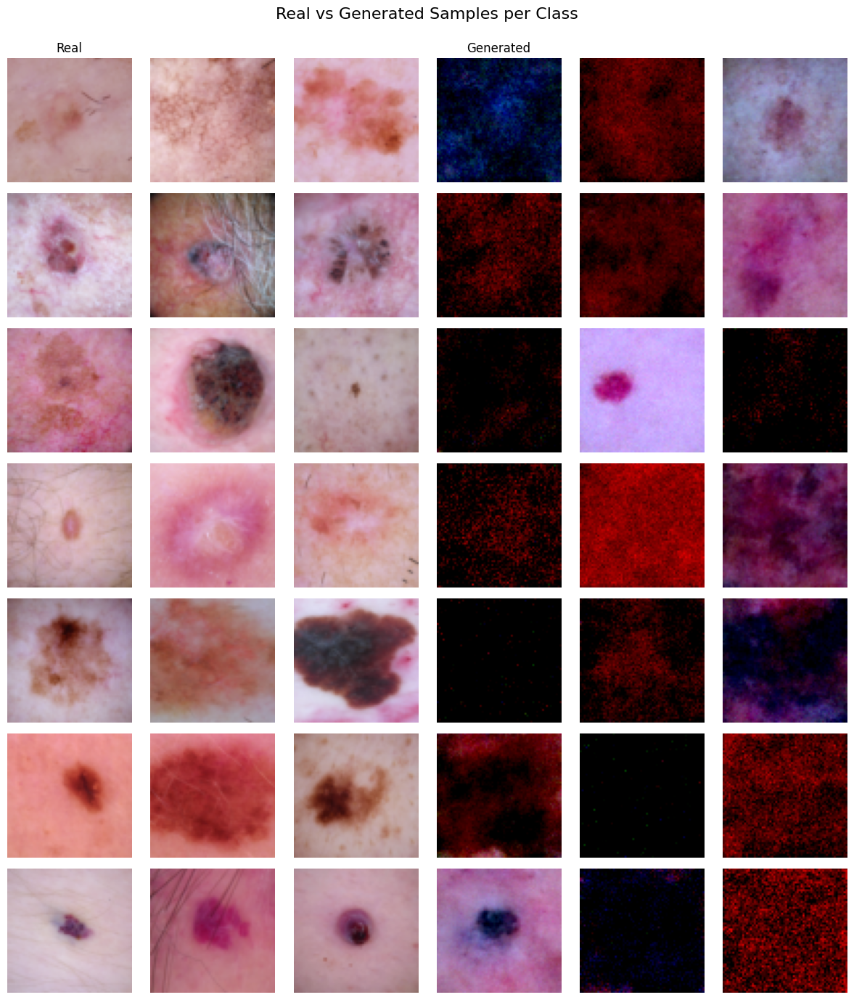

In [16]:
checkpoint_path = f"checkpoints/best_model_{dataset_name}.pt"

if not os.path.exists(checkpoint_path):
        raise FileNotFoundError(f"Checkpoint file not found at {checkpoint_path}")

checkpoint = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(checkpoint)
model.eval()
print(f"Loaded model from {checkpoint_path}")

visualize_real_vs_generated(model, val_loader, device, n_classes)